<a href="https://colab.research.google.com/github/MuhammadM20/example-notebooks/blob/master/Copy_of_traffic_weather.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Traffic, Weather, Accidents and MDS Visualization Notebook
This notebook shows example queries and visualization using pymongo 

Note that the maps below only render on firefox and safari.

# Setup Packages that are needed

In [0]:
# lets setup the dependencies
!apt install python3-rtree 
!pip install git+git://github.com/geopandas/geopandas.git
!pip install descartes 

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
  python3-pkg-resources
Suggested packages:
  python3-setuptools
The following NEW packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
  python3-pkg-resources python3-rtree
0 upgraded, 5 newly installed, 0 to remove and 25 not upgraded.
Need to get 671 kB of archives.
After this operation, 3,948 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex4v5 amd64 1.8.5-5 [219 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex-c4v5 amd64 1.8.5-5 [51.7 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-pkg-resources all 39.0.1-2 [98.8 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex-dev amd64 1.8.5-5 [285 k

In [0]:
# import packages and config
import time
from copy import deepcopy
import json
import pymongo
import geopandas as gpd
import os
import folium
from dateutil import tz
import datetime
import pandas as pd
from shapely.ops import cascaded_union
from shapely.geometry import *
from IPython.display import HTML
from IPython.display import display
from IPython.display import IFrame


# Setup connection details - for mondodb

This is interactive - code will block for your input

After this -run the next cell and check wether connection was successful

In [0]:
# please execute the cell. Each getpass command will result in an interactive prompt when its executed. You will enter the asked input there.

from getpass import getpass

USER = getpass('Enter User Name here: ')
PASS = getpass('Enter Password here: ')
AUTH_DB  = getpass('Enter AUTH_DB here: ')
HOST   = getpass('Enter HOST here: ')
PORT    = getpass('Enter PORT here: ')

#USER = "data-class-user"
#PASS = "zH97xk5Hbhyc&4C6"
#AUTH_DB = "data-class-access"
#HOST = "35.184.66.196"
#PORT = "27017"

Enter User Name here: ··········
Enter Password here: ··········
Enter AUTH_DB here: ··········
Enter HOST here: ··········
Enter PORT here: ··········


## 1. Setup Connection to MongoDB

First we have to install geopandas, only run the following block once. It may require restarting the notebook after we run the block to include these dependencies.

In [0]:
# connect to the mongo database
mongo_url = "mongodb://{}:{}@{}:{}/?authSource={}".format(USER,
                                                         PASS,
                                                         HOST,
                                                         PORT,
                                                         AUTH_DB)

client = pymongo.MongoClient(mongo_url)
db = client['data-class']
print("collection names: {}".format(db.list_collection_names()))

collection names: ['here.chattanooga', 'mds-availability-bird-v3', 'here.nashville.shapes.elevation', 'here.chattanooga.shapes', 'darksky.chattanooga', 'here.nashville.shapes', 'geo_incidents', 'etrims.accidents', 'darksky.nashville', 'rt.gtfs.nashville.vehicle.positions', 'here.nashville', 'mds-trips-bird-v3']


**Above:** available collections are as listed above

# 2. Accident Data

Accident data is stored in the "geo_incidents" collection.

In [0]:
reading = db['geo_incidents'].find_one()
reading

{'_id': ObjectId('59565fc50218236fb2c3bac2'),
 'alarmDateTime': datetime.datetime(2014, 3, 21, 10, 38, 34, 463000),
 'alarmDateTimeEpoch': 1395398314.463,
 'arrivalDateTime': '2014,03,21,10,45,55,560000',
 'arrivalDateTimeEpoch': 1395398755.56,
 'city': 'Nashville',
 'county': 'Davidson',
 'distToIntersection': 0.07148600000000001,
 'emdCardNumber': '10D1',
 'fireZone': '28',
 'hexCell': 5300,
 'incidentNumber': 'FFD140321024462',
 'latitude': 36.14465377,
 'location': {'coordinates': [-86.63572803, 36.14465377], 'type': 'Point'},
 'longitude': -86.63572803,
 'respondingVehicles': [{'apparatusID': 'EN33',
   'arrivalDateTime': '2014,03,21,10,50,15,427000',
   'clearDateTime': '2014,03,21,11,01,15,047000',
   'dispatchDateTime': '2014,03,21,10,38,34,463000'},
  {'apparatusID': 'MED12',
   'arrivalDateTime': '2014,03,21,10,45,55,560000',
   'clearDateTime': '2014,03,21,11,50,49,120000',
   'dispatchDateTime': '2014,03,21,10,38,34,463000'}],
 'respondingVehiclesEpoch': [{'apparatusID': 'E

In [0]:
# get time range in collection
epoch_time_field = "alarmDateTimeEpoch"
time_zone = tz.gettz('America/Chicago')
collection = 'geo_incidents'

# earliest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, 1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp(timestamp_utc).replace(tzinfo=datetime.timezone.utc).astimezone(time_zone)
print("earliest time: {}".format(time_object.strftime("%B %d, %Y")))

# latest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, -1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp(timestamp_utc).replace(tzinfo=datetime.timezone.utc).astimezone(time_zone)
print("latest time: {}".format(time_object.strftime("%B %d, %Y")))

earliest time: February 20, 2014
latest time: January 03, 2020


## 3. Traffic Speed Data

In [0]:
#reading = db['here.nashville'].find_one()
#reading
cursor = db['here.nashville'].find({'time' : { '$gte': 1568561400, '$lt' : 1568566800}})

avg = 0
tot_sum = 0
num_entries = 0

for reading in cursor:
  tot_sum = tot_sum + reading['JF']
  num_entries +=1

avg = tot_sum/num_entries
avg


1.2223083732306899

In [0]:
geojson_coordinate_list=[
          [
            [
              -86.77963256835938,
              36.1955251660701
            ],
            [
              -86.80864334106445,
              36.18582733706129
            ],
            [
              -86.78186416625977,
              36.143142624690505
            ],
            [
              -86.75233840942383,
              36.15658804468937
            ],
            [
              -86.77963256835938,
              36.1955251660701
            ] 
                    
          ]
      ]

query={
     "geom": {
       "$geoWithin": {
          "$geometry": {
             "type" : "Polygon" ,
             "coordinates": geojson_coordinate_list
          }
       }
     }
   }

selected_tmcs=db['here.nashville'].find(query)
selected_tmc_objects=[x for x in selected_tmcs]
selected_tmc_ids=[x['JF'] for x in selected_tmc_objects]
selected_tmc_ids

In [0]:
cursor = db['here.nashville'].find({'time' : { '$gte': 1568561400, '$lt' : 1568566800}})

test_data = []

avg = 0
tot_sum = 0
num_entries = 0

for reading in cursor:
  #print(reading)
  list_reading = reading
  shape = db['here.nashville.shapes'].find({"tmc_id": selected_tmc_ids})
  #if shape is not None:
    #list_reading['geometry'] = shape['geom']
  #print (list_reading)
  test_data.append(list_reading)
  

test_data

for reading in test_data:
  tot_sum = tot_sum + reading['JF']
  num_entries +=1


  
  avg = tot_sum/num_entries
  print(avg)

 

Streaming output truncated to the last 5000 lines.
1.1518692452234696
1.151898822398798
1.1519563591508808
1.1519770161498437
1.1520179783144888
1.1520675048045121
1.152067791991731
1.1520962667431438
1.1521733757815553
1.152208095046884
1.152248964093143
1.1523060159453873
1.1523274548322255
1.1523330615697773
1.1523564696604642
1.1523440988730453
1.152311055800875
1.1523057809318915
1.152293436460595
1.1523182042606794
1.1523023037444724
1.152331551936687
1.1523094455275147
1.1522791009431987
1.1522480319362338
1.1522396866668494
1.1522243627450899
1.1522193085853436
1.1522282127500922
1.152203332473406
1.1521703066957039
1.1521373584797419
1.1521609736314047
1.1521582115731768
1.1521251908746908
1.152092172068888
1.1520591551556059
1.1520261401346814
1.1519931270059522
1.1519601157692556
1.1519271064244285
1.151894098971309
1.1518610934097337
1.1518312821982095
1.1517982803277667
1.1517652803483858
1.1517322822599045
1.1516992860621604
1.151666291754991
1.1516332993382332
1.15160030

KeyboardInterrupt: ignored

**Above:** an example of one speed reading. Note that each reading is timestamped with the field "time". The actual speed in MPH at this time is given by the field "SU". The associated Traffic Message Channel (TMC) for this reading is given by the field "tmc_id".

In [0]:
# get time range in collection
epoch_time_field = "time"
time_zone = tz.gettz('America/Chicago')
collection = 'here.nashville'

# earliest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, 1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp(timestamp_utc).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("earliest time: {}".format(time_object.strftime("%B %d, %Y")))

# latest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, -1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp(timestamp_utc).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("latest time: {}".format(time_object.strftime("%B %d, %Y")))

earliest time: August 20, 2019
latest time: March 24, 2020


## 4. Traffic Shapes

Each TMC id represents a list of geo-coordinates representing a road segment. We store these static objects in the collection "here.nashville.shapes". 

In [0]:
example_shape = db['here.nashville.shapes'].find_one()
example_shape

{'_id': ObjectId('5e3cacd5d9facdc11f6ae318'),
 'free_flow_speed': 52.82,
 'geom': {'coordinates': [[[-86.76045, 36.1548],
    [-86.76076, 36.1548],
    [-86.761, 36.1548],
    [-86.76128, 36.15477],
    [-86.76153, 36.15475]],
   [[-86.76153, 36.15475],
    [-86.76185, 36.15468],
    [-86.76208, 36.15463],
    [-86.76232, 36.15454],
    [-86.76253, 36.15445]],
   [[-86.76253, 36.15445],
    [-86.76279, 36.15431],
    [-86.76345, 36.15395],
    [-86.76412, 36.15364]]],
  'type': 'MultiLineString'},
 'tmc_id': '4208+0.22556',
 'tmc_pc_queue': '4208+'}

**Above:** the field "geom" holds a geojson representation of the shape for the TMC id in the 'tmc_id' field. 

In [0]:
# get all shape objects
response = db['here.nashville.shapes'].find()
static_shape_data = [x for x in response]

In [0]:
shp_list = [asShape(MultiLineString(x['geom']['coordinates'])) for x in static_shape_data]
shp = cascaded_union(shp_list)
center = shp.centroid
m = folium.Map(location=[center.y, center.x], zoom_start=13)
bounds = shp.bounds
m.fit_bounds([[bounds[1], bounds[0]], [bounds[3], bounds[2]]])
style_function = lambda x: {"color": 'blue'}
folium.GeoJson(mapping(shp), style_function=style_function, name='geom').add_to(m)
folium.LayerControl().add_to(m)
m

**Above:** visualization of all TMC road segments in Nashville, TN

## 5. Weather data

Weather is collected from the DarkSky API

In [0]:
example = db['darksky.nashville'].find_one()
example

{'_id': ObjectId('5e3c59625e7d953b34f9cdcd'),
 'agency': 'darksky',
 'apparent_temperature': 30.7,
 'cloud_cover': 0.02,
 'dew_point': 25.86,
 'geometry': {'coordinates': [-86.7833, 36.166683], 'type': 'Point'},
 'humidity': 0.82,
 'icon': 'clear-night',
 'nearest_storm_distance': 0,
 'ozone': 297.5,
 'precipitation_intensity': 0,
 'precipitation_probability': 0,
 'pressure': 1031.5,
 'summary': 'Clear',
 'temperature': 30.7,
 'time': 1576818455,
 'timezone': 'US/Eastern',
 'uv_index': 0,
 'visibility': 10,
 'wind_bearing': 129,
 'wind_gust': 3.31,
 'wind_speed': 2.22}

In [0]:
# get time range in collection
epoch_time_field = "time"
time_zone = tz.gettz('America/Chicago')
collection = 'darksky.nashville'

# earliest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, 1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp(timestamp_utc).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("earliest time: {}".format(time_object.strftime("%B %d, %Y")))

# latest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, -1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp(timestamp_utc).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("latest time: {}".format(time_object.strftime("%B %d, %Y")))

earliest time: August 20, 2019
latest time: March 24, 2020


In [0]:
#find all readings > 40
example_data = db['darksky.nashville'].find( { "temperature": {"$gt" : 40}} )
#get all temperature observations
example_temp = [x["temperature"] for x in example_data]
example_pandas = pd.DataFrame(example_temp)
#make a box plot from the observations
boxplot=example_pandas.boxplot()

# 6 MDS Data

There are two types of data. 

See documentation at: https://github.com/openmobilityfoundation/mobility-data-specification/tree/0.3.x/provider

mds-availability-bird-v3: status changes, shows when a vehicle is now ready to be used.

mds-trips-bird-v3: scooter trips.

In [0]:
# example availability data
example = db['mds-availability-bird-v3'].find_one()
example

{'_id': ObjectId('5e78ce53d56d5ad51eb96f8f'),
 'battery_pct': 1.0,
 'device_id': '6c0fd8c8-55c0-4d91-9e1b-7fc2d06db41c',
 'event_location': {'geometry': {'coordinates': [-86.7457181, 36.1770848],
   'type': 'Point'},
  'properties': {'timestamp': 1566450125000},
  'type': 'Feature'},
 'event_time': 1566450125000,
 'event_type': 'removed',
 'event_type_reason': 'service_end',
 'geometry': {'coordinates': [-86.7457181, 36.1770848], 'type': 'Point'},
 'propulsion_type': ['electric'],
 'provider_id': '2411d395-04f2-47c9-ab66-d09e9e3c3251',
 'provider_name': 'bird',
 'vehicle_id': 'ZT9HS',
 'vehicle_type': 'scooter'}

In [0]:
# get time range in collection
epoch_time_field = "event_time"
time_zone = tz.gettz('America/Chicago')
collection = 'mds-availability-bird-v3'

# earliest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, 1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp((timestamp_utc/1000)).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("earliest time: {}".format(time_object.strftime("%B %d, %Y")))

# latest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, -1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp((timestamp_utc/1000)).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("latest time: {}".format(time_object.strftime("%B %d, %Y")))

earliest time: August 22, 2019
latest time: March 24, 2020


In [0]:
# example trips data
example = db['mds-trips-bird-v3'].find_one()
example

{'_id': ObjectId('5e78ce5f0f6270ce77585653'),
 'accuracy': 152,
 'actual_cost': 187,
 'device_id': 'dd548e05-7974-4dfc-872e-6c40b7988ecb',
 'end_time': 1566471905287,
 'geometry': {'coordinates': [[-86.7994921, 36.1462415],
   [-86.799535, 36.146107]],
  'type': 'LineString'},
 'parking_verification_url': 'https://s3.amazonaws.com/bird-uploads-production/ride-photos/e2ba7348-8eb3-4f0b-ab97-0bb3f9954451.png',
 'propulsion_type': ['electric'],
 'provider_id': '2411d395-04f2-47c9-ab66-d09e9e3c3251',
 'provider_name': 'Bird',
 'route': {'features': [{'geometry': {'coordinates': [-86.7994921, 36.1462415],
     'type': 'Point'},
    'properties': {'timestamp': 1566471760475},
    'type': 'Feature'},
   {'geometry': {'coordinates': [-86.799535, 36.146107], 'type': 'Point'},
    'properties': {'timestamp': 1566471905287},
    'type': 'Feature'}],
  'type': 'FeatureCollection'},
 'standard_cost': 187,
 'start_time': 1566471760475,
 'timelist': [1566471760475, 1566471905287],
 'trip_distance': 1

In [0]:
# get time range in collection
epoch_time_field = "end_time"
time_zone = tz.gettz('America/Chicago')
collection = 'mds-trips-bird-v3'

# earliest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, 1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp((timestamp_utc/1000)).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("earliest time: {}".format(time_object.strftime("%B %d, %Y")))

# latest time
timestamp_utc = db[collection].find({epoch_time_field: {"$exists": True}}).sort([(epoch_time_field, -1)]).limit(1).next()[epoch_time_field]
time_object = datetime.datetime.fromtimestamp((timestamp_utc/1000)).replace(tzinfo=datetime.timezone.utc).astimezone(central_time)
print("latest time: {}".format(time_object.strftime("%B %d, %Y")))

earliest time: August 22, 2019
latest time: March 12, 2020


## 7. Advanced MongoDB Queries

Here are a couple of example queries to get comfortable with MongoDB. To access there are two primary resources.

1. MongoDB reference Manual: https://docs.mongodb.com/manual/
2. PyMongo API: https://api.mongodb.com/python/current/index.html

The pymongo documentation is a python implementation of the Mongo interface outlined in the MongoDB documentation. The pymongo documentation is limited in description and assumes some familiarity with the MongoDB documentation.

### 7.1 find operation

See documentation for the find method in pymongo here: https://api.mongodb.com/python/current/api/pymongo/collection.html and in mongodb here: https://docs.mongodb.com/manual/reference/method/db.collection.find/#db.collection.find

This is the simplest interface and is good for simple queries.

Example: find all HERE speed data between 8AM and 8:30AM CST december 21, 2019 and sort by time

In [0]:
def find_dec21():
  # example below gets all HERE speed data for december 21, 2019 in nashville
  start_time = datetime.datetime(year=2019, month=12, day=21, hour=8, minute=0, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))
  end_time = datetime.datetime(year=2019, month=12, day=22, hour=8, minute=30, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))
  # note that start_time and end_time could also be specified in Unix time, this link is useful: https://www.epochconverter.com/
  print("start_time: {}, end_time: {}".format(start_time, end_time))
  print("start_time (timestamp format): {}, end_time (timestamp format): {}".format(start_time.timestamp(), end_time.timestamp()))
  query = {"time": {"$gte": start_time.timestamp(), "$lte": end_time.timestamp()}}
  result = db["here.nashville"].find(query).sort("time", 1)
  data = [x for x in result]
  print("length of data: {}".format(len(data)))
  data[0]

find_dec21()

start_time: 2019-12-21 08:00:00-05:00, end_time: 2019-12-22 08:30:00-05:00
start_time (timestamp format): 1576933200.0, end_time (timestamp format): 1577021400.0
length of data: 1992272


### 8.2 Aggregation pipeline

The aggregation pipeline is a more complex interface which is useful for multistep queries. You essentially build a list of operations to be run one after another.

Aggregation intro: https://docs.mongodb.com/manual/aggregation/
Aggregation stages: https://docs.mongodb.com/manual/reference/operator/aggregation-pipeline/
Aggregation operators: https://docs.mongodb.com/manual/reference/operator/aggregation/

Example: get average speed for each TMC between 8 and 8:30AM on December 21, 2019

Note that you can separate these queries by code and do the postprocessing in python code - but that will be inefficient

In [0]:
# example below gets all HERE speed data for december 21, 2019 in nashville between 8 and 8:30AM
start_time = datetime.datetime(year=2019, month=12, day=21, hour=8, minute=0, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))
end_time = datetime.datetime(year=2019, month=12, day=22, hour=8, minute=30, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))

pipeline = [{"$match": {"time": {"$gte": start_time.timestamp(), "$lte": end_time.timestamp()}}},
            {"$group": {"_id": "$tmc_id", "cur_speed": {"$avg": "$SU"}}}]
result = db['here.nashville'].aggregate(pipeline)
data = [x for x in result]
data[0:10]

[{'_id': '13495+0.23475', 'cur_speed': 19.965563689604686},
 {'_id': '12360+2.62532', 'cur_speed': 34.174377745241586},
 {'_id': '6025-0.49999', 'cur_speed': 25.356061493411417},
 {'_id': '50904+0.66204', 'cur_speed': 22.799062957540265},
 {'_id': '4676-0.05803', 'cur_speed': 68.04206140350878},
 {'_id': '4240+0.10584', 'cur_speed': 62.814035087719304},
 {'_id': '50643-0.12137', 'cur_speed': 12.833060029282576},
 {'_id': '8798-3.90625', 'cur_speed': 52.49477306002928},
 {'_id': '10729-0.05757', 'cur_speed': 55.51896046852123},
 {'_id': '8798+4.2897', 'cur_speed': 53.03879941434846}]

## 9 Speed visualization

Lets use the tools we have developed above to identify roads with heavy traffic between 8AM and 8:30AM on December 21, 2019 in Nashville, TN. For simplicity we will consider any segment with an average speed in this time window < 75 percent of its free flow speed to be heavy traffic.

In [0]:
# get average speed during this time window for each TMC id
start_time = datetime.datetime(year=2019, month=12, day=21, hour=8, minute=0, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))
end_time = datetime.datetime(year=2019, month=12, day=22, hour=8, minute=30, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))

pipeline = [{"$match": {"time": {"$gte": start_time.timestamp(), "$lte": end_time.timestamp()}}},
            {"$group": {"_id": "$tmc_id", "cur_speed": {"$avg": "$SU"}}}]
result = db['here.nashville'].aggregate(pipeline)

# put this into a pandas dataframe
speeds = pd.DataFrame(data=[x for x in result])
speeds = speeds.rename(columns={'_id': 'tmc_id'})
speeds.head()

,tmc_id,cur_speed
0,7016-6.20751,48.570703
1,8639-0.12715,29.771290
2,8621-0.52795,19.670821
3,12363-0.055,25.000454
4,9172+0.64999,22.694773


In [0]:
# get all shape objects
response = db['here.nashville.shapes'].find()
shape_data = [x for x in response]

# put this into a geopandas dataframe (geopandas is an extension of pandas with geospatial indexing)
data = []
for d in shape_data:
  geometry = MultiLineString(d['geom']['coordinates'])
  data.append({'free_flow_speed': d['free_flow_speed'], 'tmc_id': d['tmc_id'], 'geometry': geometry})
shapes = gpd.GeoDataFrame(data=data)
shapes.head()

,free_flow_speed,tmc_id,geometry
0,52.82,4208+0.22556,"MULTILINESTRING ((-86.76045 36.15480, -86.7607..."
1,53.07,4207+0.28303,"MULTILINESTRING ((-86.76412 36.15364, -86.7644..."
2,54.99,4206+0.27079,"MULTILINESTRING ((-86.76853 36.15163, -86.7685..."
3,53.19,4205+0.26089,"MULTILINESTRING ((-86.77282 36.14981, -86.7730..."
4,54.68,4205-0.19131,"MULTILINESTRING ((-86.77762 36.14830, -86.7767..."


In [0]:
# lets join speeds and shapes so that we have one dataframe for plotting
data = gpd.GeoDataFrame(data=speeds.join(shapes.set_index('tmc_id'), on='tmc_id'))
data.head()

,tmc_id,cur_speed,free_flow_speed,geometry
0,7016-6.20751,48.570703,50.70,"MULTILINESTRING ((-87.34057 36.08208, -87.3402..."
1,8639-0.12715,29.771290,32.50,"MULTILINESTRING ((-86.38540 35.83730, -86.3859..."
2,8621-0.52795,19.670821,24.92,"MULTILINESTRING ((-86.77120 36.15179, -86.7713..."
3,12363-0.055,25.000454,26.72,"MULTILINESTRING ((-86.83307 35.97331, -86.8327..."
4,9172+0.64999,22.694773,31.19,"MULTILINESTRING ((-86.69183 36.30274, -86.6922..."


In [0]:
def get_color(props):
  free_flow_speed = props['free_flow_speed']
  cur_speed = props['cur_speed']
  if (free_flow_speed is None) or (cur_speed is None):
    return 'blue'
  elif cur_speed < free_flow_speed * .75:
    return 'red'
  else:
    return 'blue'

plot_data = data.to_json()
m = folium.Map(location=[36.15, -86.8], zoom_start=13)
style_function = lambda x: {"color": get_color(x['properties'])}
folium.GeoJson(plot_data, style_function=style_function).add_to(m)
folium.LayerControl().add_to(m)
display(m)

## 10 Weather Boxplot

Here we will create a histogram of weather over one week of data.

See documentation at: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.boxplot.html

In [0]:
# setup
start_time = datetime.datetime(year=2019, month=12, day=22, hour=0, minute=0, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))
end_time = datetime.datetime(year=2019, month=12, day=29, hour=0, minute=0, second=0, tzinfo=datetime.timezone(-datetime.timedelta(hours=5)))

# make query
query = {"time": {"$gte": start_time.timestamp(), "$lte": end_time.timestamp()}}
result = db["darksky.nashville"].find(query)
data = [x for x in result]

# put into dataframe
weather_data = pd.DataFrame(data=data)
weather_data.head()

,_id,geometry,time,timezone,agency,summary,icon,nearest_storm_distance,precipitation_probability,precipitation_intensity,temperature,apparent_temperature,dew_point,humidity,pressure,wind_speed,wind_gust,wind_bearing,cloud_cover,uv_index,visibility,ozone
0,5e3c59625e7d953b34f9cfac,"{'type': 'Point', 'coordinates': [-86.7833, 36...",1576991014,US/Eastern,darksky,Possible Drizzle,rain,0,0.45,0.014,44.01,44.01,36.44,0.75,1028.8,2.57,4.69,55,0.97,0,10.0,291.2
1,5e3c59625e7d953b34f9cfad,"{'type': 'Point', 'coordinates': [-86.7833, 36...",1576991374,US/Eastern,darksky,Overcast,cloudy,0,0.21,0.003,43.76,43.76,36.46,0.75,1028.8,2.46,4.69,54,0.97,0,10.0,291.1
2,5e3c59625e7d953b34f9cfae,"{'type': 'Point', 'coordinates': [-86.7833, 36...",1576991734,US/Eastern,darksky,Possible Drizzle,rain,0,0.64,0.014,43.76,43.76,36.52,0.75,1028.8,2.42,4.68,53,0.97,0,10.0,291.1
3,5e3c59625e7d953b34f9cfaf,"{'type': 'Point', 'coordinates': [-86.7833, 36...",1576992095,US/Eastern,darksky,Possible Light Rain,rain,0,0.45,0.016,43.76,43.76,36.57,0.76,1028.8,2.38,4.67,53,0.97,0,10.0,291.0
4,5e3c59625e7d953b34f9cfb0,"{'type': 'Point', 'coordinates': [-86.7833, 36...",1576992455,US/Eastern,darksky,Possible Light Rain,rain,0,0.41,0.017,43.77,43.77,36.63,0.76,1028.7,2.33,4.66,52,0.97,0,10.0,290.9


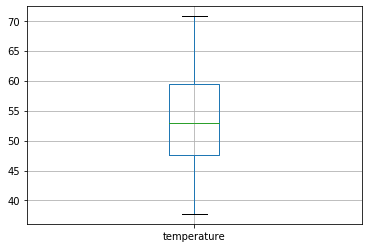

In [0]:
# single boxplot - temperature
boxplot = weather_data.boxplot(column=['temperature'])
boxplot

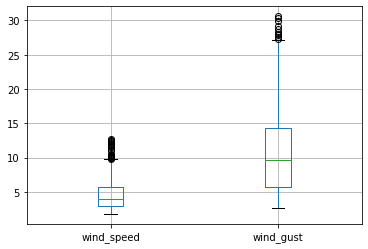

In [0]:
# you can do a boxplot of two fields on the same plot
boxplot = weather_data.boxplot(column=['wind_speed', 'wind_gust'])
boxplot

In [0]:
client.close()